In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from keras.layers import *
from tensorflow.keras import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16, MobileNetV2
import random

import warnings
warnings.filterwarnings('ignore')

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle

In [4]:
!kaggle datasets download kritikseth/fruit-and-vegetable-image-recognition

Dataset URL: https://www.kaggle.com/datasets/kritikseth/fruit-and-vegetable-image-recognition
License(s): CC0-1.0


In [5]:
import zipfile

zip_ref = zipfile.ZipFile("/content/fruit-and-vegetable-image-recognition.zip")
zip_ref.extractall("/content")
zip_ref.close()

##Image Data Generation method


In [28]:
train_datagen = ImageDataGenerator(rescale = 1./255)

test_datagen = ImageDataGenerator(rescale = 1./255)

validation_datagen = ImageDataGenerator(rescale = 1./255)

In [29]:
train_df = train_datagen.flow_from_directory("/content/train", target_size = (150, 150), color_mode = 'rgb', class_mode = 'categorical', batch_size = 32)
test_df = test_datagen.flow_from_directory("/content/test", target_size = (150, 150), color_mode = 'rgb', class_mode = 'categorical', batch_size = 32)
validation_df = validation_datagen.flow_from_directory("/content/validation", target_size = (150, 150), color_mode = 'rgb', class_mode = 'categorical', batch_size = 32)

Found 3115 images belonging to 36 classes.
Found 359 images belonging to 36 classes.
Found 351 images belonging to 36 classes.


## Data visualization

In [30]:
def process_image(path, num_images):
  # Get a list of image filenames
  image_filenames = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]

  if not image_filenames:
    raise ValueError(f"No Image file found in {path}")

  # Select random images
  selected_images = random.sample(image_filenames, min(num_images, len(image_filenames)))

  # Create a figure and axes
  fig, axes = plt.subplots(1, num_images, figsize=(15, 2), facecolor='white')

  # Display each image
  for i, image_filename in enumerate(selected_images):
      # Load image
      image_path = os.path.join(path, image_filename)
      image = plt.imread(image_path)

      # Display image
      axes[i].imshow(image)
      axes[i].axis('off')
      axes[i].set_title(image_filename)  # Set image filename as title

  # Adjust layout and display
  plt.tight_layout()
  plt.show()

In [31]:
fruit_list = ["banana", "apple", "pear", "grapes", "orange", "kiwi", "watermelon", "pomegranate", "pineapple", "mango"]
veg_list = ["cucumber", "carrot", "capsicum", "onion", "potato", "lemon", "tomato", "raddish", "beetroot", "cabbage",
            "lettuce", "spinach", "soy beans", "cauliflower", "bell pepper", "chilli pepper", "turnip", "corn", "sweetcorn", "sweetpotato",
            "paprika", "jalepeno", "ginger", "garlic", "peas", "eggplant"]

print(f"Total categorical values in the dataset is {len(fruit_list) + len(veg_list)}")

Total categorical values in the dataset is 36


## Fruits

**************** BANANA ****************



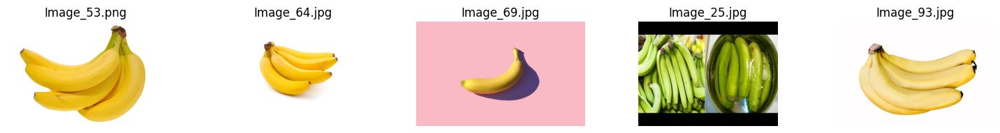

None

**************** APPLE ****************



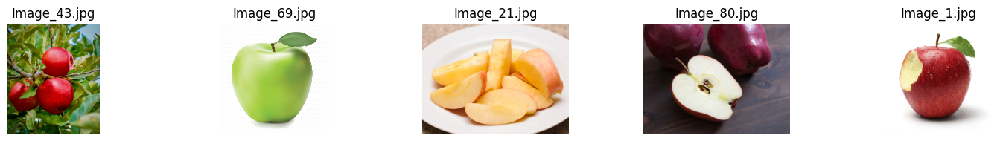

None

**************** PEAR ****************



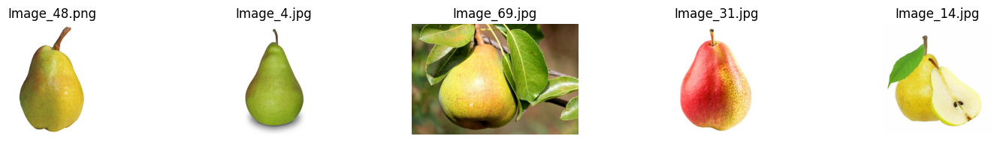

None

**************** GRAPES ****************



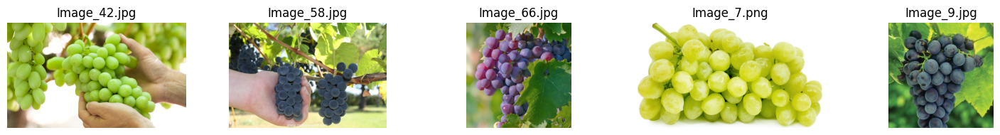

None

**************** ORANGE ****************



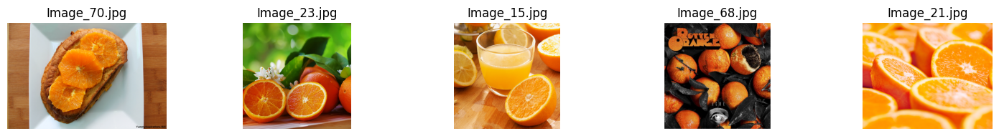

None

**************** KIWI ****************



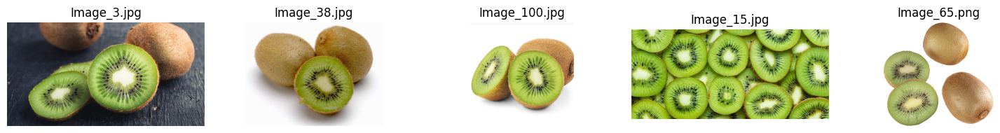

None

**************** WATERMELON ****************



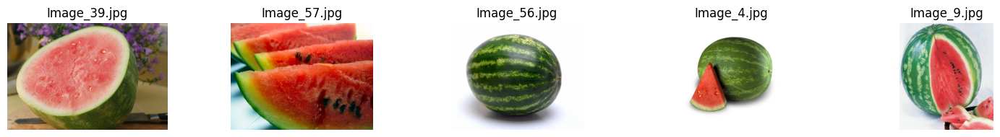

None

**************** POMEGRANATE ****************



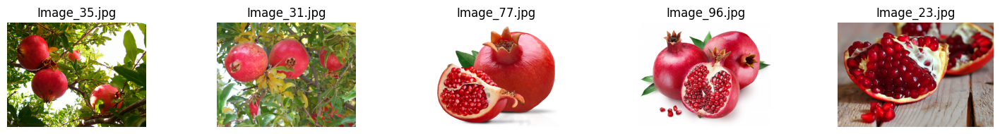

None

**************** PINEAPPLE ****************



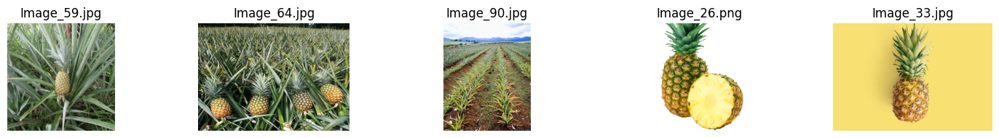

None

**************** MANGO ****************



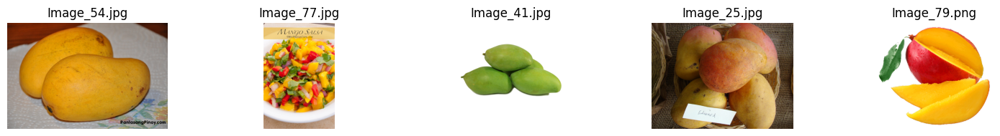

None



In [32]:
for i in fruit_list:
  print("****************", i.upper(), "****************")
  print()
  print(process_image("/content/train/" + i, num_images = 5))
  print()

## Vegetables

**************** CUCUMBER ****************



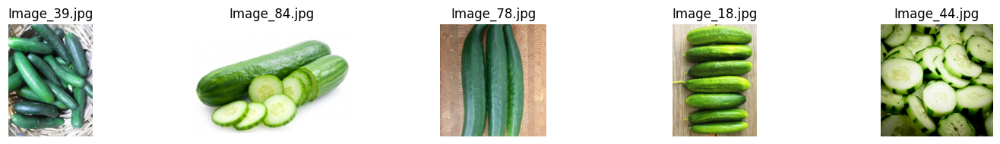

None

**************** CARROT ****************



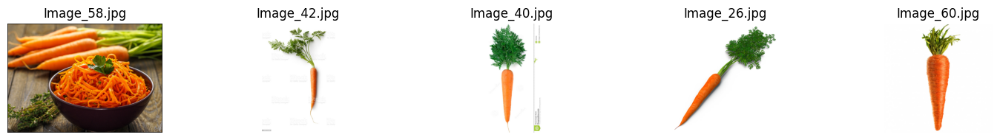

None

**************** CAPSICUM ****************



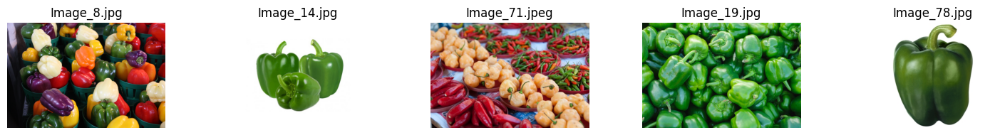

None

**************** ONION ****************



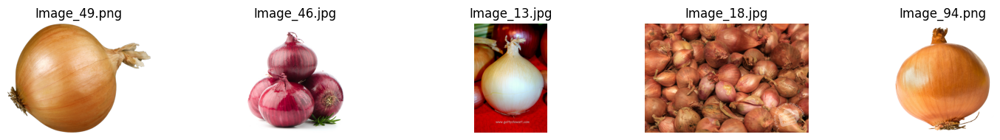

None

**************** POTATO ****************



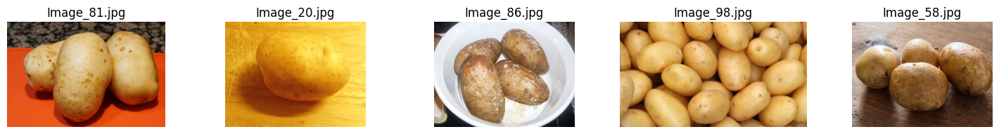

None

**************** LEMON ****************



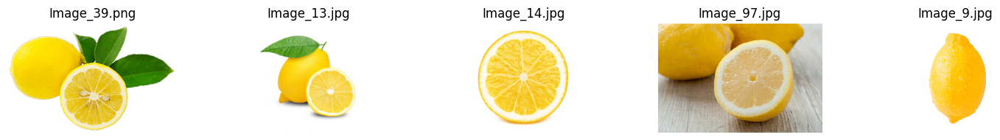

None

**************** TOMATO ****************



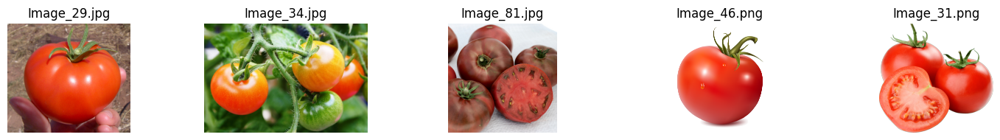

None

**************** RADDISH ****************



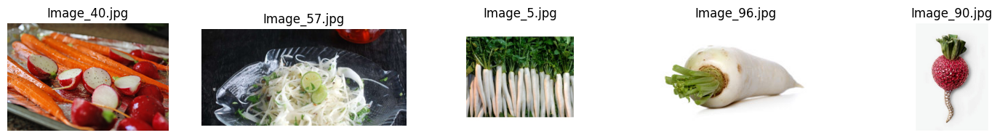

None

**************** BEETROOT ****************



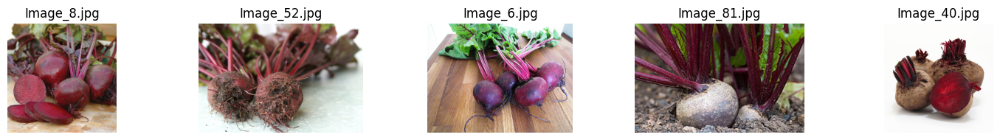

None

**************** CABBAGE ****************



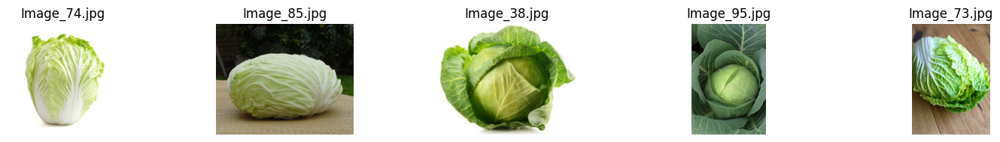

None

**************** LETTUCE ****************



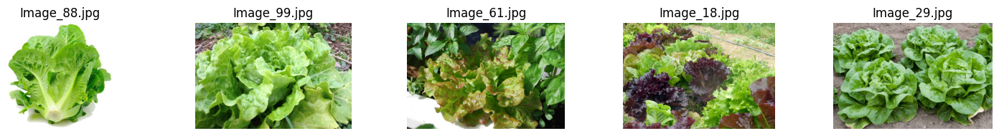

None

**************** SPINACH ****************



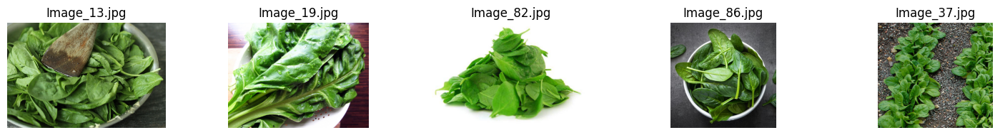

None

**************** SOY BEANS ****************



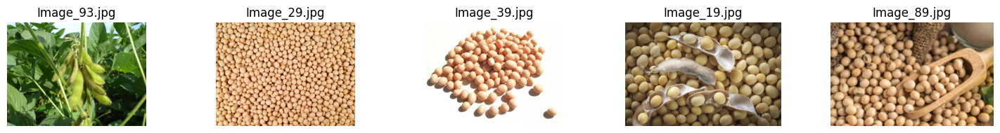

None

**************** CAULIFLOWER ****************



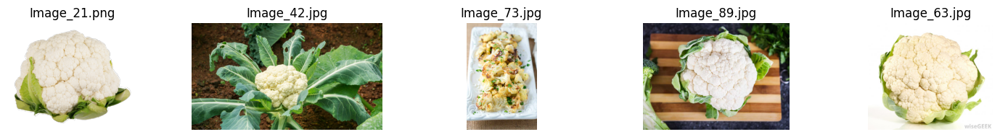

None

**************** BELL PEPPER ****************



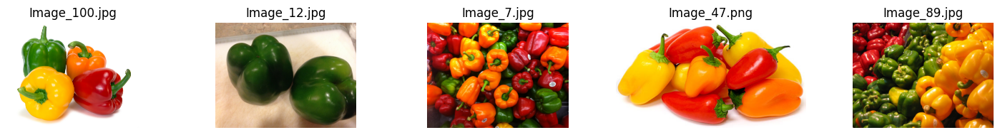

None

**************** CHILLI PEPPER ****************



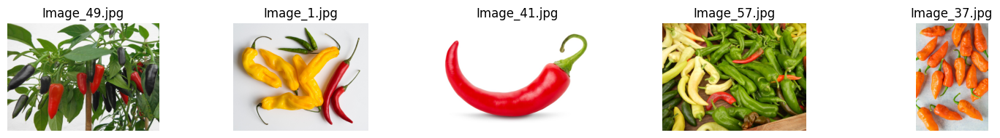

None

**************** TURNIP ****************



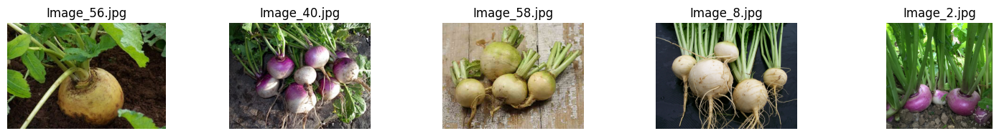

None

**************** CORN ****************



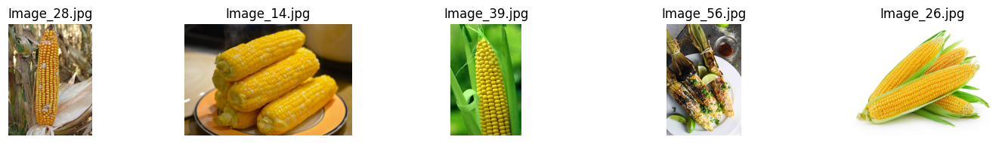

None

**************** SWEETCORN ****************



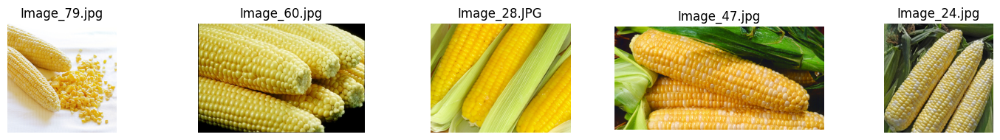

None

**************** SWEETPOTATO ****************



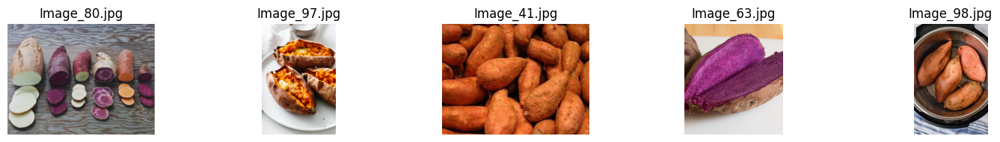

None

**************** PAPRIKA ****************



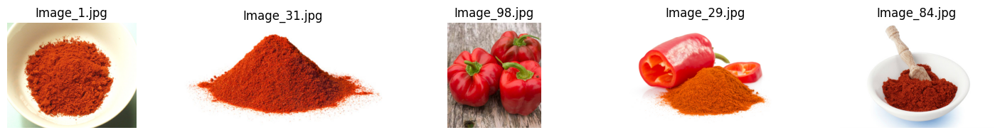

None

**************** JALEPENO ****************



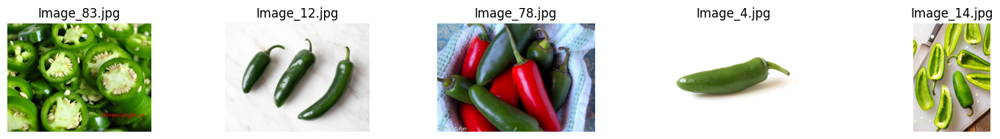

None

**************** GINGER ****************



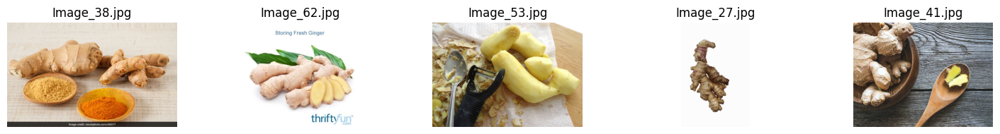

None

**************** GARLIC ****************



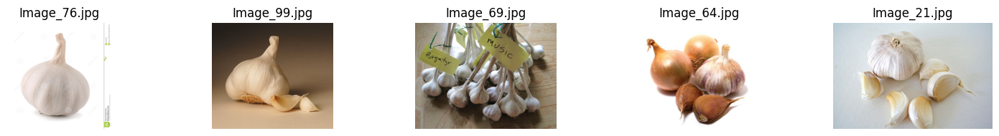

None

**************** PEAS ****************



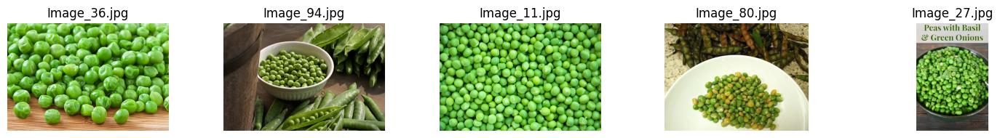

None

**************** EGGPLANT ****************



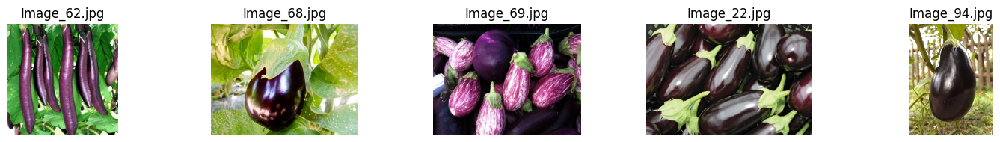

None



In [33]:
for i in veg_list:
  print("****************", i.upper(), "****************")
  print()
  print(process_image("/content/train/" + i, num_images = 5))
  print()

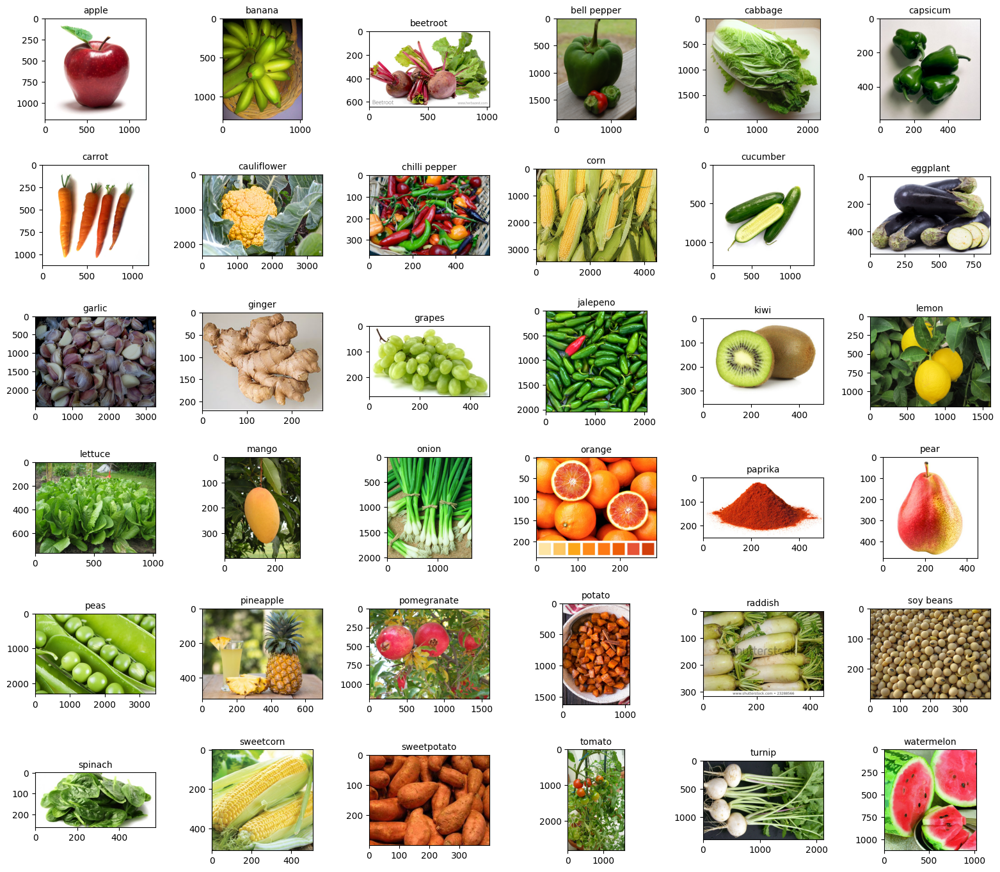

In [34]:
base_dir = '/content'
train_path = os.path.join(base_dir, 'train')
test_path = os.path.join(base_dir, 'test')
validation_path = os.path.join(base_dir, 'validation')

categories = sorted(os.listdir(train_path))

# Initialize list for sample images
sample_images = []
for category in categories:
    category_path = os.path.join(train_path, category)
    first_image = os.listdir(category_path)[0]
    sample_images.append(os.path.join(category_path, first_image))

fig, axes = plt.subplots(nrows=6, ncols=6, figsize=(16, 14))

for ax, img_path, label in zip(axes.flat, sample_images, categories):
    ax.imshow(plt.imread(img_path))  # Display the image
    ax.set_title(label, fontsize=10)  # title for each image

plt.tight_layout(pad=2)
plt.show()

## CNN Model



In [35]:
model=Sequential()

model.add(Conv2D(32,kernel_size=(3,3),padding='valid',activation='relu',input_shape=(150,150,3)))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='valid'))


model.add(Conv2D(64,kernel_size=(3,3),padding='valid',activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='valid'))


model.add(Conv2D(128,kernel_size=(3,3),padding='valid',activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='valid'))

model.add(Flatten())

model.add(Dense(128,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dense(36,activation='softmax'))

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)                    │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 36992)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 128)                 │       4,735,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 36)                  │           2,340 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,838,948 (18.46 MB)

 Trainable params: 4,838,948 (18.46 MB)

 Non-trainable params: 0 (0.00 B)

In [36]:
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [37]:
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor = 'val_accuracy', patience = 5, verbose = 1)

history = model.fit(train_df, validation_data = test_df, epochs = 50, callbacks=[es])

Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 93s 905ms/step - accuracy: 0.0424 - loss: 3.5672 - val_accuracy: 0.1365 - val_loss: 2.9751
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 93s 956ms/step - accuracy: 0.1450 - loss: 2.9426 - val_accuracy: 0.3148 - val_loss: 2.2828
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 85s 868ms/step - accuracy: 0.2775 - loss: 2.4151 - val_accuracy: 0.4791 - val_loss: 1.6762
Epoch 4/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 84s 860ms/step - accuracy: 0.3564 - loss: 2.1301 - val_accuracy: 0.6574 - val_loss: 1.1798
Epoch 5/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 92s 940ms/step - accuracy: 0.4939 - loss: 1.6643 - val_accuracy: 0.7131 - val_loss: 1.0388
Epoch 6/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 82s 836ms/step - accuracy: 0.5947 - loss: 1.3759 - val_accuracy: 0.7911 - val_loss: 0.8144
Epoch 7/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 82s 838ms/step - accuracy: 0.6985 - loss: 1.0264 - val_accuracy: 0.8942 - val_loss: 0.4968
Epoch 8/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 90s 925ms/step - accuracy: 0.7930 - loss: 0.6616 - val_accu

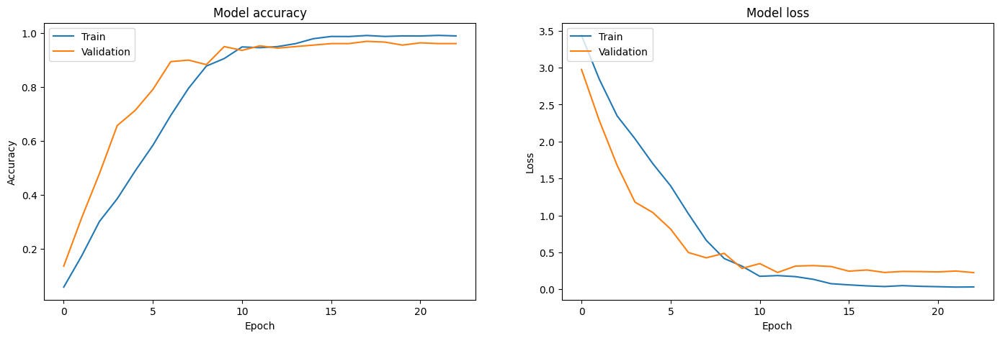

In [38]:
# Plot training & validation accuracy values
plt.figure(figsize=(17, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [39]:
model.evaluate(validation_df)

11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.9592 - loss: 0.2037


[0.23048409819602966, 0.9601139426231384]

In [40]:
model.evaluate(test_df)

12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 923ms/step - accuracy: 0.9742 - loss: 0.1188


[0.2254071831703186, 0.961002767086029]

In [41]:
from PIL import Image
import requests
import io

url = 'https://media.istockphoto.com/id/168278888/photo/fresh-slices-of-mango-on-a-bed-of-leaves.webp?a=1&b=1&s=612x612&w=0&k=20&c=yr6EiJ0XruGksZEmpMaz99BYwE-TU9xXzeWZ-NQAcAY='

response = requests.get(url)
image = Image.open(io.BytesIO(response.content))
image = image.convert('RGB')  # Ensure 3 channels (RGB)
image_resized = image.resize((150, 150))  # Resize to model input size

# Convert image to numpy array and normalize
img_array = np.array(image_resized) / 255.0  # Normalize to [0, 1]
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

# Predict using the trained model
prediction = model.predict(img_array)
predicted_class = categories[np.argmax(prediction)]

print(f"Predicted class: {predicted_class}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
Predicted class: mango


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


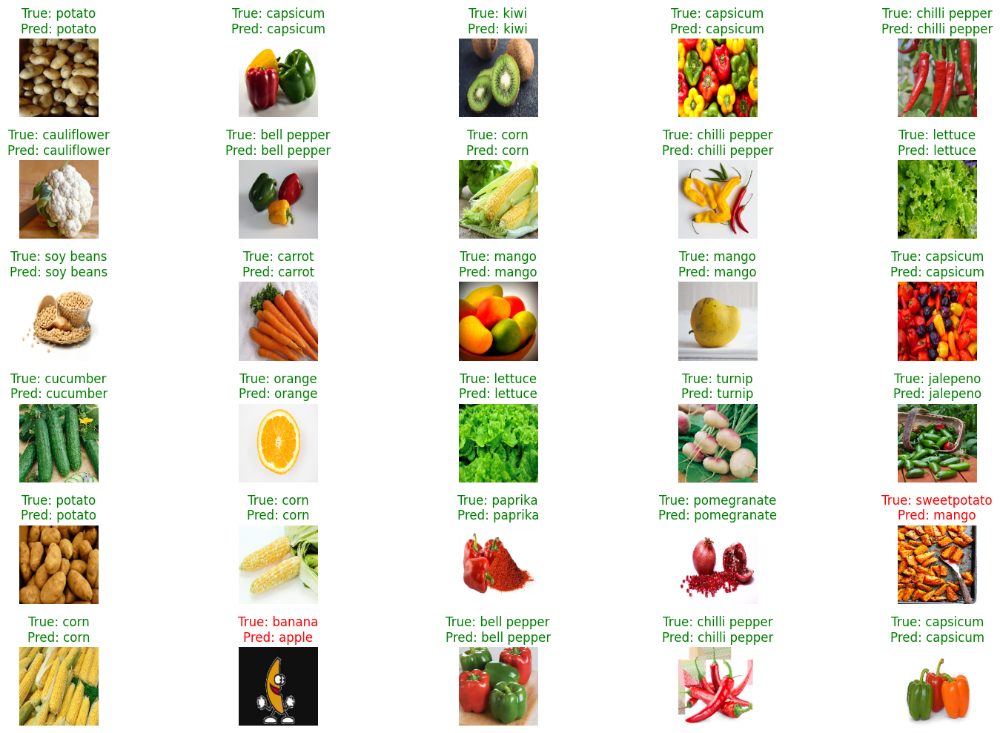

In [42]:
val_images, val_labels = next(validation_df)
indices = random.sample(range(len(val_images)), 30)

predictions = model.predict(val_images[indices])
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(val_labels[indices], axis=1)

plt.figure(figsize=(16, 10))
for i, idx in enumerate(indices):
    plt.subplot(6, 5, i + 1)
    plt.imshow(val_images[idx])
    plt.axis('off')

    true_label = categories[true_labels[i]]
    predicted_label = categories[predicted_labels[i]]
    color = 'green' if true_label == predicted_label else 'red'

    plt.title(f"True: {true_label}\nPred: {predicted_label}", color=color)

plt.tight_layout()
plt.show()